In [298]:
from typing import List

import numpy as np
from os import getcwd, listdir
from PIL import Image

from indoorca.simulator.core import MultiAgentSim
from indoorca.simulator.core import Agent
from indoorca.visualization.core import Visualizer
from indoorca.visualization.core import VisualizerConfig


In [299]:
#Refresh the libraries before running the code
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [300]:
#Get maps from data/maps
maps = []
map_path = getcwd() + '/../data/maps/'
for map_name in listdir(map_path):
    print(map_name)
    im = Image.open(map_path + map_name)
    print(np.asarray(im).shape)
    maps.append(np.asarray(im))

test = maps[0]
#Convert to one channel grayscale

# test = maps[-1]
#Generate a test environment with no obstacles
# test = np.ones((800,800))
#TODO: Next test with small square obstacle

def create_array_with_center_zeros(shape, block_shape):
    if any(s % 2 == 0 for s in block_shape):
        raise ValueError("The block_shape must have odd dimensions to be centered.")
    if any(s > a_s for s, a_s in zip(block_shape, shape)):
        raise ValueError("The block_shape dimensions must be smaller than the shape dimensions.")
    
    # Create an array of ones with the given shape
    arr = np.ones(shape, dtype=int)

    # Calculate the start and end indices for the block of zeros
    start_row = (shape[0] - block_shape[0]) // 2
    end_row = start_row + block_shape[0]
    start_col = (shape[1] - block_shape[1]) // 2
    end_col = start_col + block_shape[1]

    # Replace the elements in the specified block with zeros
    arr[start_row:end_row, start_col:end_col] = 0

    return arr

# test = create_array_with_center_zeros((601,601), (101,101))
# test = np.ones((801,801))

Rs.png
(1000, 1000)


In [301]:
# num_agents = 4
# dist = 1.
# agent_starts_meters = [(1, 1),(-1, -1), (-1,1), (1, -1),(dist, dist)]
# agent_goals_meters = [(-1, -1),(1, 1), (1,-1), (-1., 1),(dist, -dist)]
# # agent_starts_meters = [(0.25, 0), (1, -1.25)]#,(dist, dist)]
# # agent_goals_meters = [(1, 1.25), (1., 1.25)]#,(dist, -dist)]
num_agents = 4
dist = 1.
agent_starts_meters = [( 1,  1), (-1, -1), (-1, 1), ( 1, -1)]
agent_goals_meters =  [(-1, -1), ( 1,  1), ( 1,-1), (-1., 1)]

In [302]:
#TODO: Add a limit to the number of steps
#TODO: Add obstacles for outer walls
#TODO: Add start and end points for each agent
#TODO: Add white pixels in the map for better obstacle detection

sim = MultiAgentSim('test', test, num_agents=num_agents)

In [303]:


def step():
    #TODO Keep track of max num_steps
    for agent_id, agent in sim.agents.items():
        # if len(sim.agent_waypoints[agent_id]) == 0:
        #     raise Exception('Agent {} has no more waypoints'.format(agent_id))
        
        agent_pos = sim.sim.get_agent_position(agent_id)
        waypoints = sim.agent_waypoints[agent_id]
        current_pos = agent_pos

        #Check if agent has reached goal
        if np.linalg.norm(np.array(agent_pos) - np.array(agent_goals_meters[agent_id])) < sim.pedestrian_goal_thresh:
            print('Agent {} reached goal'.format(agent_id))
            temp = agent_goals_meters[agent_id]
            agent_goals_meters[agent_id] = agent_starts_meters[agent_id]
            agent_starts_meters[agent_id] = temp

            sim.agent_waypoints[agent_id] = sim.get_waypoints(current_pos, agent_goals_meters[agent_id])
            sim.arrived_at_goal[agent_id] = True


        #Here we need to resample for waypoints or check if its done
        if len(waypoints) == 0:
            # print('#'*10)
            # print('We need to get new waypoints for agent {}'.format(agent_id))
            goal_pos = agent_goals_meters[agent_id]
            # print('Getting new waypoints for agent {}'.format(agent_id))
            sim.agent_waypoints[agent_id] = sim.get_waypoints(current_pos, goal_pos)   
            # print('# of waypoints: {}'.format(len(sim.agent_waypoints[agent_id])))
            # if len(sim.agent_waypoints[agent_id]) == 0:
            #     print('#Agent {} has no more waypoints'.format(agent_id))
            #     print('#Its current position is {}'.format(current_pos))
            #     print('#Its goal position is {}'.format(goal_pos))   
            waypoints = sim.agent_waypoints[agent_id]
            # print('#'*10)

        #TODO: Add a max amount of time for the agent to reach the waypoint
        #TODO: Implement backing up detection
        # print('Next waypoint for agent {} is {}'.format(agent_id, sim.agent_waypoints[agent_id]))
        # print('len(waypoints): {}'.format(len(waypoints)))
        # print('waypoint[0]: {}'.format(waypoints[0]))

        next_goal = sim.agent_waypoints[agent_id][0]
        desired_velocity = np.array(next_goal) - np.array(current_pos)
        desired_velocity = (desired_velocity / np.linalg.norm(desired_velocity)) * sim.sim.get_max_speed()
        sim.sim.set_agent_pref_velocity(agent_id, list(desired_velocity))

    if np.all([sim.arrived_at_goal[agent_id] for agent_id in sim.agents.keys()]):
        print('All agents have reached their goals')
        return True

    sim.sim.do_step()
 
    #TODO: Check if agent has reached goal
    #Check if agent has reached waypoint, if so pop it
    for agent_id, agent in sim.agents.items():
        agent_pos = sim.sim.get_agent_position(agent_id)
        next_goal = sim.agent_waypoints[agent_id][0]
        if np.linalg.norm(np.array(agent_pos) - np.array(next_goal)) < sim.pedestrian_goal_thresh:
            sim.agent_waypoints[agent_id].pop(0)

    return False
        #Check if agent reached goal
        # if np.linalg.norm(np.array(agent_pos) - np.array(agent_goals_meters[agent_id]) < sim.pedestrian_goal_thresh):
        #     print('Agent {} reached goal'.format(agent_id))
        #     temp = agent_goals_meters[agent_id]
        #     agent_goals_meters[agent_id] = agent_starts_meters[agent_id]
        #     agent_starts_meters[agent_id] = temp

            # sim.agent_waypoints[agent_id] = []
            # sim.sim.set_agent_pref_velocity(agent_id, [0,0])
    

In [304]:
# agent_starts_meters = []
# agent_goals_meters = []
# for i in range(num_agents):
#     agent_starts_meters.append(tuple(sim.env.get_random_point()))
#     agent_goals_meters.append(tuple(sim.env.get_random_point()))

# print('Agent starts: {}'.format(agent_starts_meters))
# print('Agent goals: {}'.format(agent_goals_meters))

num_agents = 4
dist = 1.
agent_starts_meters = [(-2,  1.5), (1, -2), (2.5, 0), ( 0, 0)]
agent_goals_meters =  [(1, -2), ( 2.5,  0), (-2.25, 1.5), (3, 2)]


In [305]:
# agent_starts_meters = [(dist, dist),(-dist, dist),(dist, -dist),(dist, -dist)]
# agent_goals_meters = [(dist, -dist),(dist, -dist),(-dist, dist),(dist, dist)]
#TODO: Bug may be in getting the coarse waypoints.
#      May need to have a single global plan to get waypoints
#      Rather than recompute the shortest path at each call and
#      then getting the waypoints at a random resolution
sim.reset_sim(num_agents)
sim.agent_waypoints = {}
for agent_id, agent in sim.agents.items():
    initial_pos = agent_starts_meters[agent_id]
    goal_pos = agent_goals_meters[agent_id]
    sim.sim.set_agent_position(agent_id, initial_pos)
    waypoints = sim.get_waypoints(initial_pos, goal_pos)
    sim.agent_waypoints[agent_id] = waypoints

In [306]:
# vis_config = VisualizerConfig()
# vis = Visualizer(vis_config) 
# background = np.flipud(np.flip(sim.env.obstacle_map))

#plot the waypoints
# for agent_id, agent in sim.agents.items():
#     waypoints = sim.agent_waypoints[agent_id]
#     if agent_id == 0 or True:
#         print(len(waypoints))
#         vis.add_waypoints(waypoints)

In [307]:
done = False
num_rounds = 2
max_steps = 1000
for i in range(max_steps):
    done = step()
    if done:
        print('Done at step {}'.format(i))
        num_rounds -= 1
        sim.arrived_at_goal = {agent_id: False for agent_id in sim.agents.keys()}
        
    if num_rounds == 0:
        break
    if i == max_steps - 1:
        print('Max steps reached')
        break
    



#TODO: Assert that random points are in graph/conversion is right
#TODO: Figure out how and when the paths are getting messed up

Agent 3 reached goal
Agent 0 reached goal


/home/felipefelixarias/Research/INDOORCA/indoorca/environment/core.py:123: RuntimeWarning: invalid value encountered in double_scalars
  (np.linalg.norm(cached_slope) * np.linalg.norm(cur_slope))


Agent 2 reached goal
Agent 1 reached goal
All agents have reached their goals
Done at step 409
Agent 3 reached goal
Agent 0 reached goal
Agent 3 reached goal
Agent 2 reached goal
Agent 1 reached goal
All agents have reached their goals
Done at step 883


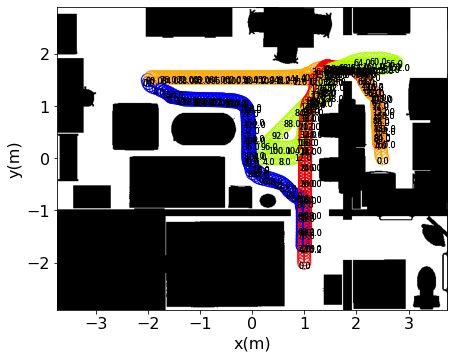

In [308]:
# vis_config = VisualizerConfig()
# vis = Visualizer(vis_config) 
# # background = np.flipud(np.flip(sim.env.obstacle_map))
# background = sim.env.map.T
# #plot the waypoints
# for agent_id, agent in sim.agents.items():
#     waypoints = sim.agent_waypoints[agent_id]
#     if agent_id == 0:
#         print(len(waypoints))
#         vis.add_waypoints(waypoints)
#     # vis.add_waypoints(waypoints)
vis_config = VisualizerConfig()
vis = Visualizer(vis_config) 
background = sim.env.map.T
vis.add_map_background(background)
vis.set_trajectories(sim.sim.trajectories[0], sim.sim.trajectories[1:])
vis.render('traj', 'indoorca.gif')
#TO Make it work again add the distance to waypoint threshold
#also known as the pedestrian_goal_thresh. Howeve, 
# pedestrian goal thresh seems to be messing with corners
#TODO: Planning and obstacles in sim are flipped


581


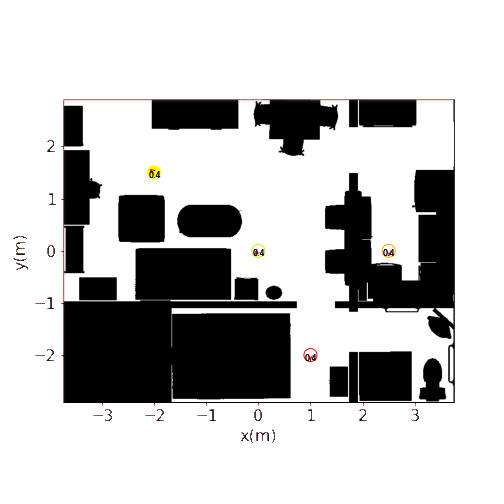

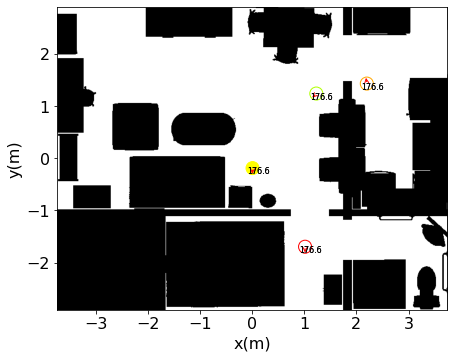

In [309]:
vis.render('video', 'indoorca.gif')
from IPython.display import Image
Image(filename='indoorca.gif')
#TODO: Reset without removing obstacles, etc.
#TODO: Implement a function for debugging that takes in starts and goals for each agent

In [310]:
# def detect_backoff(agent_id):
#     pos = sim.sim.get_agent_position(agent_id)
#     prev_pos = np.array(pos)
#     next_pos = np.array(sim.agent_waypoints[agent_id][0])

#     next_dir = next_pos - prev_pos

#     if np.linalg.norm(next_dir) == 0.:
#         return False
    
#     next_dir = next_dir / np.linalg.norm(next_dir)
#     #TODO: Check if the agent is moving backwards and keep track of yaw
#     angle = np.arccos(np.dot(next_dir, agent.direction))
#     return angle


# def update_pos_and_stop_flags():
#     next_positions = {agent_id: sim.sim.get_agent_position(agent_id) for agent_id in sim.agents.keys()}
#     next_positions_flags = {agent_id: False for agent_id in sim.agents.keys()}
    
#     for agent_id, agent in sim.agents.items():

#         pos = sim.sim.get_agent_position(agent_id)
#         prev_pos = np.array(pos)
#         next_pos = np.array(sim.agent_waypoints[agent_id][0])





In [311]:
#TODO: Add code to set initial positions of agents
# initial_positions = []
# for agent_id in sim.get_agent_ids():
#     #TODO: Add code that doesn't require agent_id for sampling locations
#     initial_positions.append(sim.sample_initial_pos(agent_id)) 
#TODO: Add code to set goals of agents
#TODO: Add code to reset everything

#TODO: Look at shortest path function to see how coarse the path is
#TODO: step for a predetermined number of steps or until shortest path is complete
#TODO: Add code to have agents move back and forth from start to goal
#TODO: Get trajectories after executing the simulation, this may be done automatically in step function
#TODO: Plot trajectories
#TODO: Add environment to visualization
#TODO: Add code to run multiple simulations and save data